In [25]:
%matplotlib inline
import matplotlib.pyplot as plt
import sys
# !{sys.executable} -m pip install librosa.display
!{sys.executable} -m pip install librosa
import librosa.display
# import librosa
import IPython.display as ipd
import scipy
import numpy

## Let's analyze some audio files!
Here's Gangplank Galleon by insaneintherain
and 1812 Overture by Tchaikovsky (the one with cannons!)

In [26]:
ipd.Audio('audio/gangplank_galleon.wav')


In [27]:
ipd.Audio('audio/1812_overture.wav')

In [28]:
a, a_sr = librosa.load('audio/gangplank_galleon.wav')
print('floating point time series contains '+str(a.shape)+' points')
print('sample rate is '+str(a_sr))
b, b_sr = librosa.load('audio/1812_overture.wav')

floating point time series contains (659229,) points
sample rate is 22050


## Now let's look at a few Feature Extraction models.

### For starters, here's an Audio Waveform Plot of Gangplank Galleon.

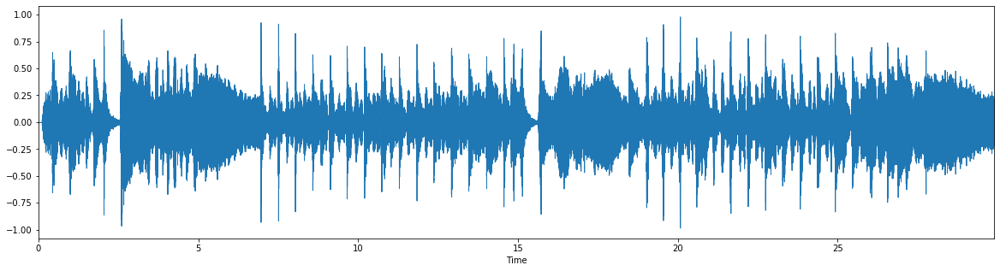

In [59]:
plt.figure(figsize=(20, 5))
librosa.display.waveplot(a, sr=a_sr)


### And for 1812

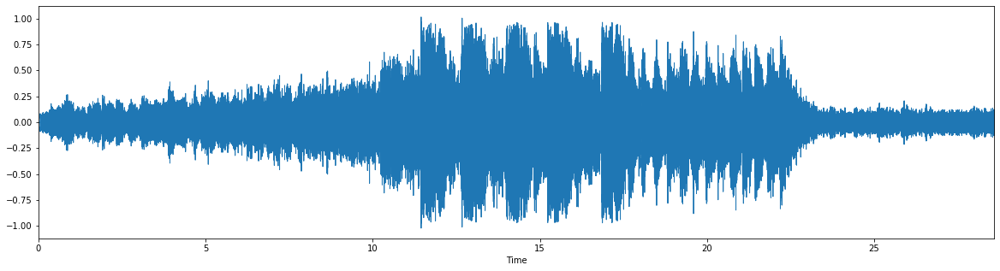

In [58]:
plt.figure(figsize=(20, 5))
librosa.display.waveplot(b, sr=b_sr)

### You can probably tell where the cannons are!

### Now let's try another common audio representation: Audio Spectrum plots- also known as Spectrograms. For Gangplank:


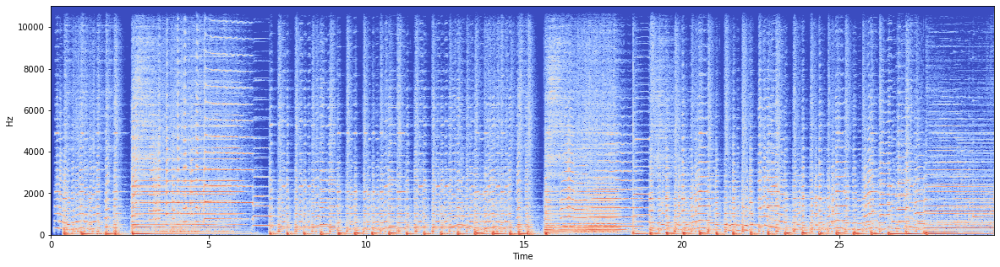

In [57]:
A = librosa.stft(a)
A_db = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(20, 5))
librosa.display.specshow(A_db, sr=a_sr, x_axis='time', y_axis='hz')

### And for 1812

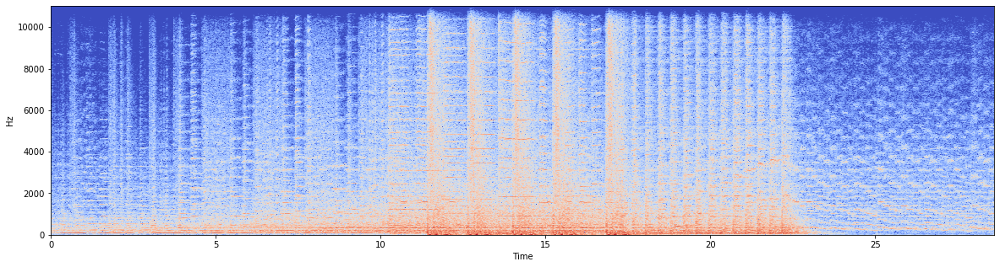

In [56]:
B = librosa.stft(b)
B_db = librosa.amplitude_to_db(abs(B))
plt.figure(figsize=(20, 5))
librosa.display.specshow(B_db, sr=b_sr, x_axis='time', y_axis='hz')

### The above 2 charts are done with a Short-time Fourier transform, which measures Frequency over Time. 

### If we wanted to measure Amplitude over Frequency, we could use a Fast Fourier Transform.

In [37]:
A_f = scipy.fft.fft(a)
A_mag = numpy.absolute(A_f)
A_f = numpy.linspace(0, a_sr, len(A_mag)) # frequency variable

Text(0.5, 0, 'Frequency (Hz)')

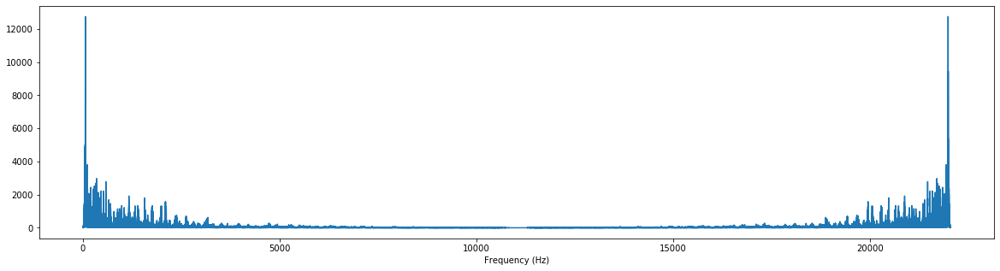

In [55]:
plt.figure(figsize=(20, 5))
plt.plot(A_f, A_mag) # magnitude spectrum
plt.xlabel('Frequency (Hz)')

In [40]:
B_f = scipy.fft.fft(b)
B_mag = numpy.absolute(B_f*2)
B_f = numpy.linspace(0, b_sr, len(B_mag)) # frequency variable

Text(0.5, 0, 'Frequency (Hz)')

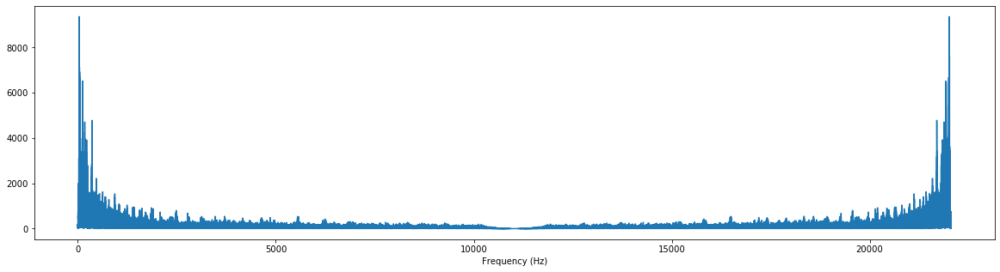

In [54]:
plt.figure(figsize=(20, 5))
plt.plot(B_f, B_mag) # magnitude spectrum
plt.xlabel('Frequency (Hz)')

### As you can see, it is much harder to distinguish which graph represents each song. 

### So far, neither of the Fourier Transforms have been great at visually demonstrating the differences between the pieces. 
### Instead, let's show the Constant-Q Transform plots. They're more expensive to compute, but they do a better job visually showing differences. Here's the one for Gangplank:

In [69]:
hop_length = 512
fmin = librosa.midi_to_hz(36)

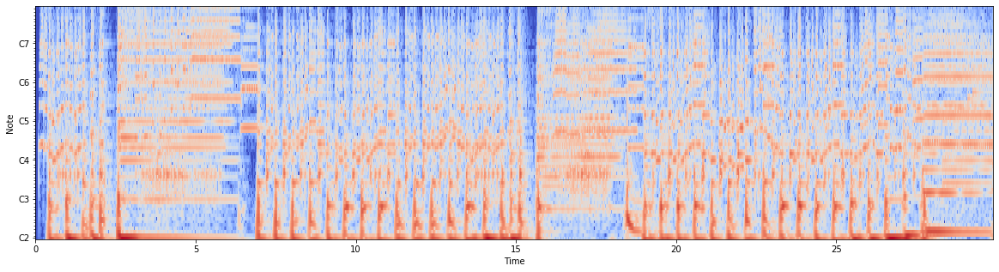

In [70]:
a_C = librosa.cqt(a, sr=a_sr, fmin=fmin, n_bins=72, hop_length=hop_length)
a_logC = librosa.amplitude_to_db(numpy.abs(a_C))
plt.figure(figsize=(20, 5))
librosa.display.specshow(a_logC, sr=a_sr, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')

### And the Constant-Q Transform for 1812:

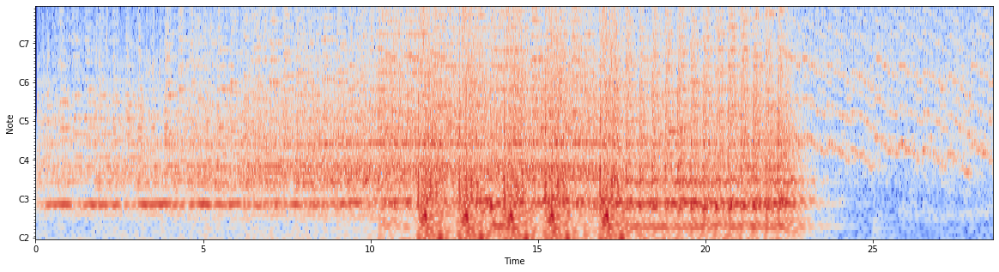

In [80]:
b_C = librosa.cqt(b, sr=b_sr, fmin=fmin, n_bins=72, hop_length=hop_length)
b_logC = librosa.amplitude_to_db(numpy.abs(b_C))
plt.figure(figsize=(20, 5))
librosa.display.specshow(b_logC, sr=b_sr, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')

### We can take the visual clarity a step further by coloring notes at each timestep by their relative magnitude. These are called Chromas!
### Here's the one for Gangplank:

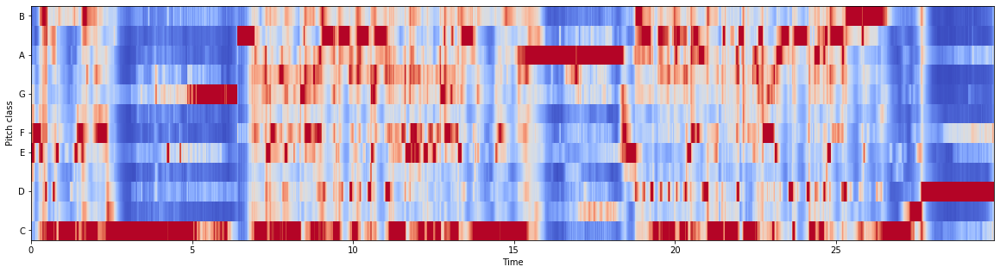

In [84]:
a_chromagram = librosa.feature.chroma_cqt(a, sr=a_sr, hop_length=hop_length)
plt.figure(figsize=(20, 5))
librosa.display.specshow(a_chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

### And here's the 1812 Chroma:

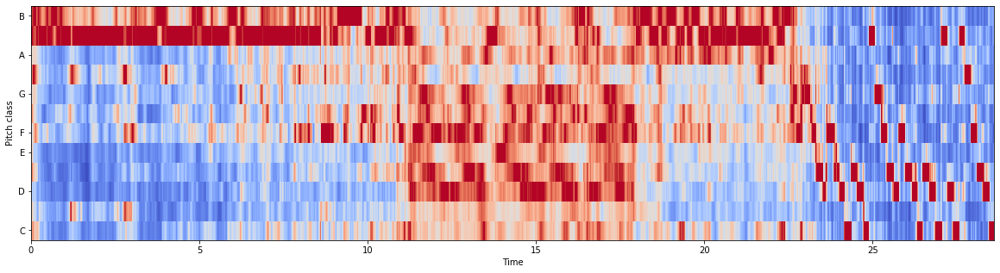

In [85]:
b_chromagram = librosa.feature.chroma_cqt(b, sr=b_sr, hop_length=hop_length)
plt.figure(figsize=(20, 5))
librosa.display.specshow(b_chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

### Now you know the pitch class of live cannons!
### For completeness, let's show the Chroma for the Short-time Fourier Transform plots. You'll likely find them to be less readable than the Constant-Q versions! Here's the one for Gangplank:

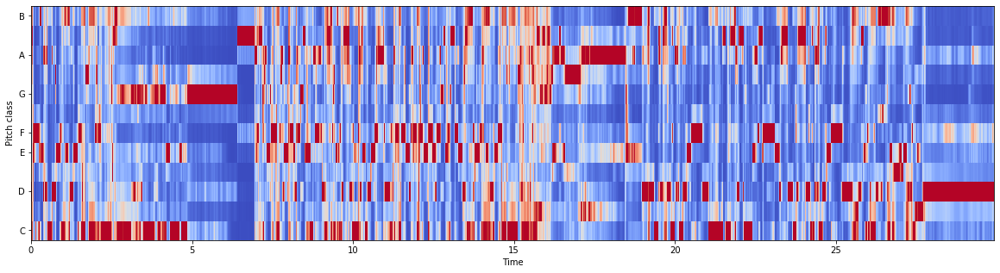

In [86]:
a_chroma = librosa.feature.chroma_stft(a, sr=a_sr, hop_length=hop_length)
plt.figure(figsize=(20, 5))
librosa.display.specshow(a_chroma, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

### And here's the STFT Chroma for 1812:

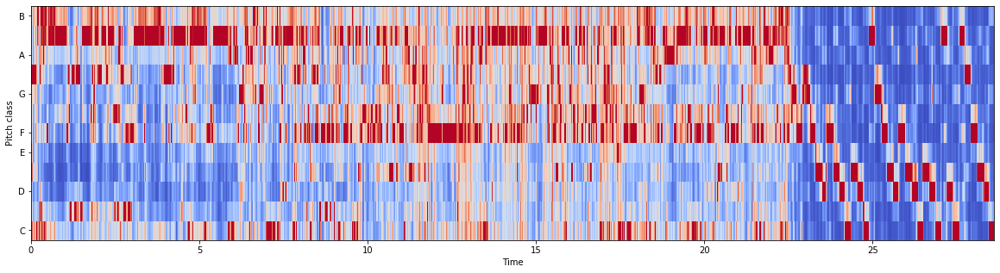

In [60]:
b_chroma = librosa.feature.chroma_stft(b, sr=b_sr, hop_length=hop_length)
plt.figure(figsize=(20, 5))
librosa.display.specshow(b_chroma, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')